In [62]:
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

import utility as u
import vplt_analysis as vplt
import dim_analysis as dim
import eyes as es

reload(u)
reload(vplt)
reload(dim)
reload(es)

<module 'eyes' from 'eyes.pyc'>

In [2]:
fn = 7
nf = 10
ff = 8
nn = 9
errorfield = 'TrialError'
tnumfield = 'trial_type'
eyefield = 'eyepos'

In [3]:
d = u.load_separate(['.'], 'bootsy-bhvit-rs-run[0-9]*.mat')
ed = d[d[errorfield] == 0] # get only trials with no error

old_d = u.load_separate(['.'], 'bootsy-bhvit-run[0-9]*.mat')
old_ed = old_d[old_d[errorfield] == 0]

#Eyes#

In [4]:
extrial = 10
nfdat = ed[ed[tnumfield] == nf]
exdat = nfdat[extrial][eyefield]

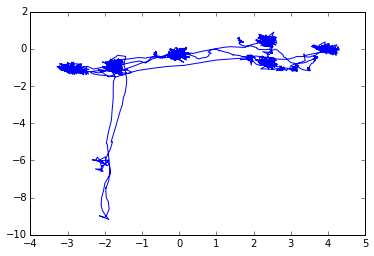

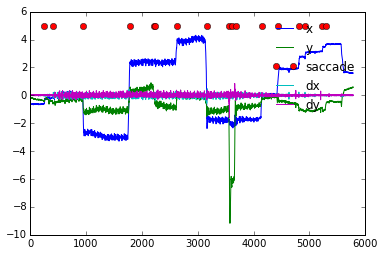

In [5]:
es.plot_eyeloc(exdat)

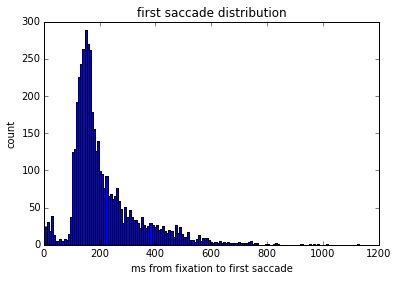

array([133, 124, 181, ..., 175, 148, 130])

In [41]:
lens, looks, s_bs, s_es = es.get_fixtimes(ed, [fn, ff, nn, nf])
es.show_sacc_latency_dist(ed)

In [ ]:
es.show_fixtime_dist(lens)
es.show_compare_fix_lens(lens, looks)
es.show_numlooks_dist(lens)

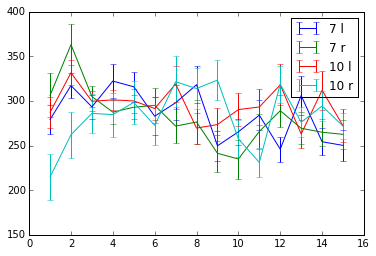

In [58]:
reload(es)
out = es.show_fixtime_by_looknum(lens, looks)

#Neurons#

### VPLT ###

#### Population ####

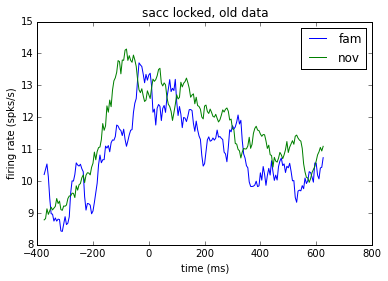

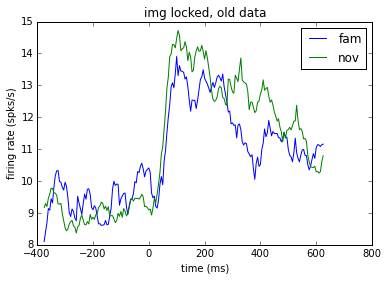

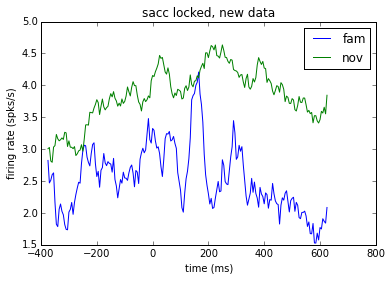

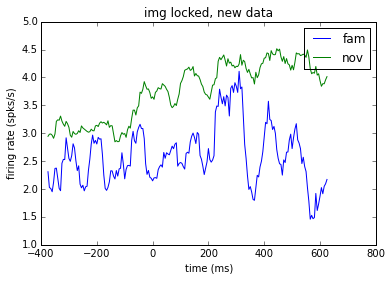

In [107]:
reload(vplt)
ns = 0
pretime = -400
posttime = 600
binsize = 50
ee = False

avgu, sinu_saccold, xs_so, nr_so = vplt.get_nsacc_activity(old_ed, ns, [fn, nf, ff, nn], 
                                                           ['7', '10', '8', '9'], 
                                                           pretime=pretime, tlim=posttime, 
                                                           binsize=binsize, slock=True, 
                                                           excl_empty=ee)
n, f = vplt.show_nov_fam_suavg(sinu_saccold, xs_so, title='sacc locked, old data')

avgu, sinu_imgold, xs_io, nr_io = vplt.get_nsacc_activity(old_ed, ns, [fn, nf, ff, nn], 
                                                           ['7', '10', '8', '9'], 
                                                          pretime=pretime, tlim=posttime, 
                                                          binsize=binsize, slock=False, 
                                                          excl_empty=ee)
n, f = vplt.show_nov_fam_suavg(sinu_imgold, xs_io, title='img locked, old data')

avgu, sinu_saccnew, xs_sn, nr_sn = vplt.get_nsacc_activity(ed, ns, [fn, nf, ff, nn], 
                                                           ['7', '10', '8', '9'], 
                                                           pretime=pretime, tlim=posttime, 
                                                           binsize=binsize, slock=True, 
                                                           excl_empty=ee)
n, f = vplt.show_nov_fam_suavg(sinu_saccnew, xs_sn, title='sacc locked, new data')

avgu, sinu_imgnew, xs_in, nr_in = vplt.get_nsacc_activity(ed, ns, [fn, nf, ff, nn], 
                                                           ['7', '10', '8', '9'], 
                                                          pretime=pretime, tlim=posttime, 
                                                          binsize=binsize, slock=False, 
                                                          excl_empty=ee)
n, f = vplt.show_nov_fam_suavg(sinu_imgnew, xs_in, title='img locked, new data')

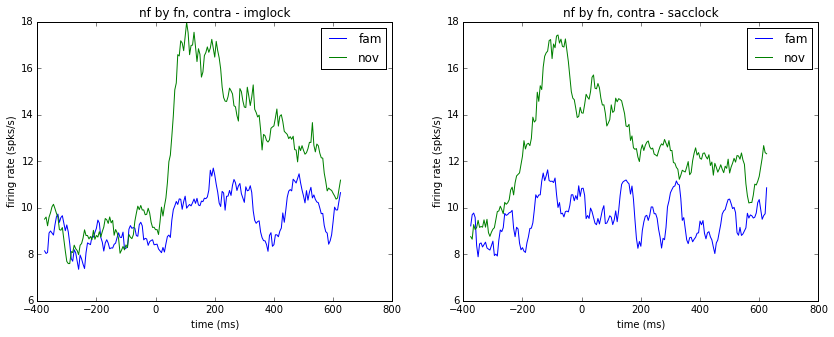

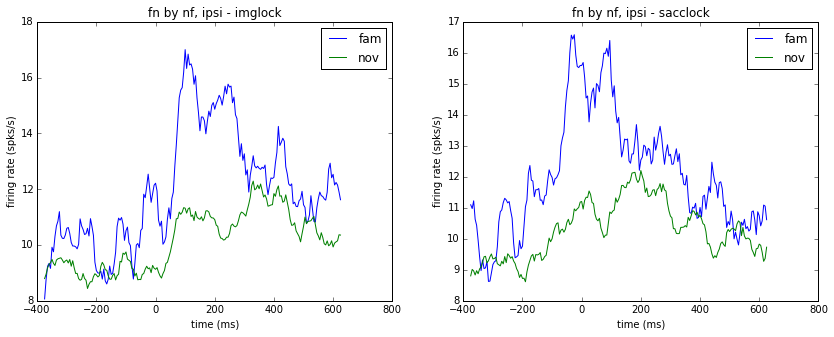

In [102]:
reload(vplt)

# saccade to contra side
# nov is nf
# fam is fn
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nf by fn, contra',
                     ipsicontra='contra')

# saccade to ipsi side
# nov is fn
# fam is nf
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='fn by nf, ipsi',
                     ipsicontra='ipsi')

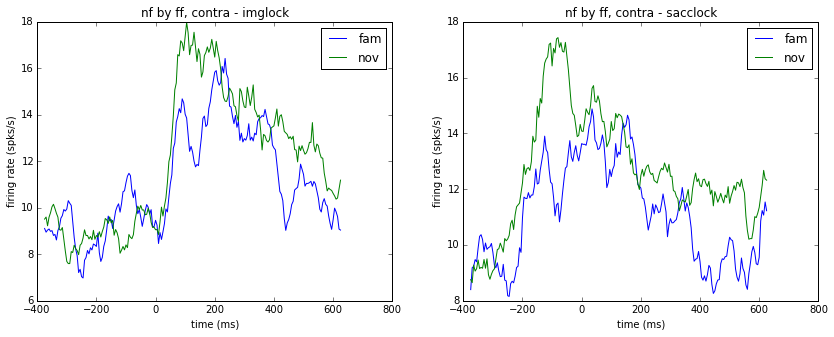

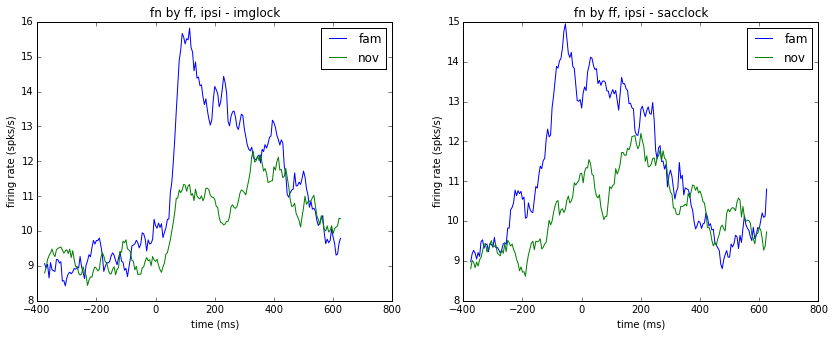

In [106]:
reload(vplt)

# saccade to contra side
# nov is nf
# fam is ff
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nf by ff, contra',
                     ipsicontra='contra', base='fam')

# saccade to ipsi side
# nov is fn
# fam is ff
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='fn by ff, ipsi',
                     ipsicontra='ipsi', base='fam')

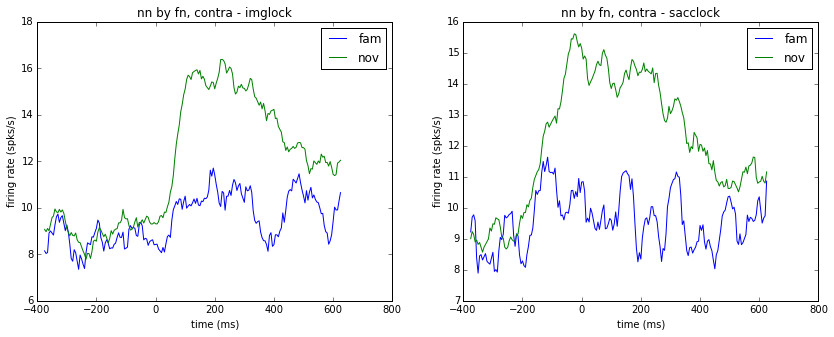

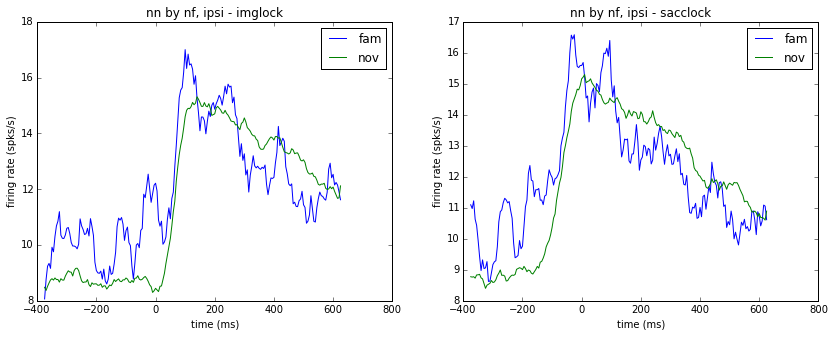

In [105]:
reload(vplt)

# saccade to contra side
# nov is nn
# fam is fn
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by fn, contra',
                     ipsicontra='contra', base='nov')

# saccade to ipsi side
# nov is nn
# fam is nf
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by nf, ipsi',
                     ipsicontra='ipsi', base='nov')

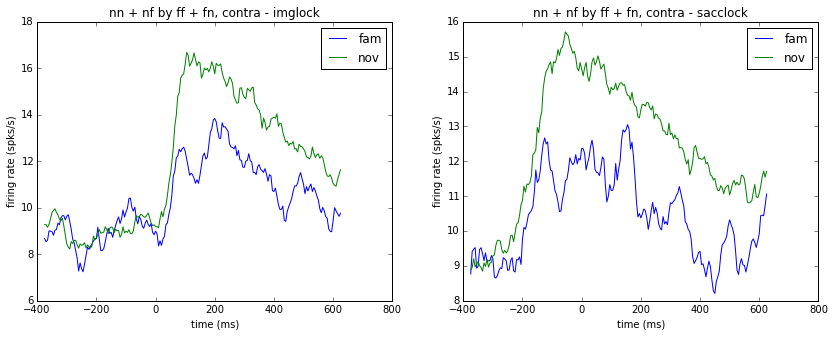

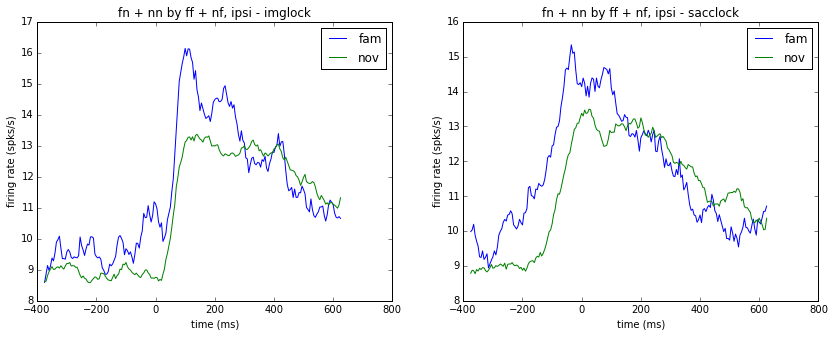

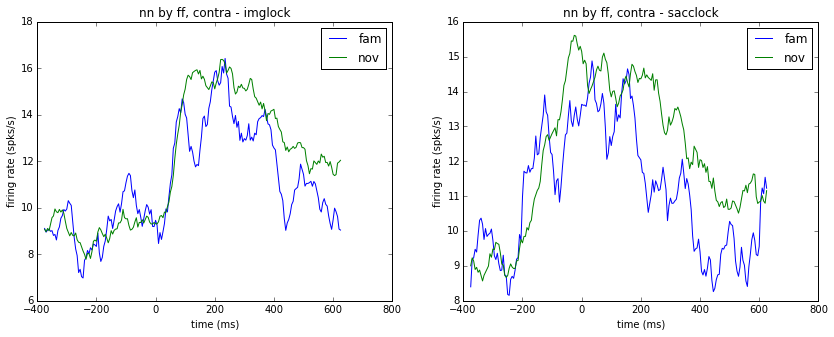

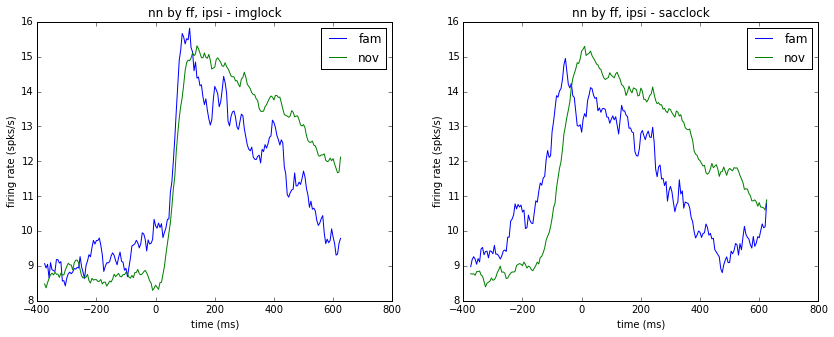

In [104]:
reload(vplt)

# saccade to contra side
# nov is nf + nn
# fam is ff + fn
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, 
                     title='nn + nf by ff + fn, contra',
                     ipsicontra='contra', base='all')

# saccade to ipsi side
# nov is fn + nn
# fam is ff + nf
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, 
                     title='fn + nn by ff + nf, ipsi',
                     ipsicontra='ipsi', base='all')

# saccade to contra side
# nov is nn
# fam is ff
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by ff, contra',
                     ipsicontra='contra', base='same')

# saccade to ipsi side
# nov is nn
# fam is ff
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by ff, ipsi',
                     ipsicontra='ipsi', base='same')

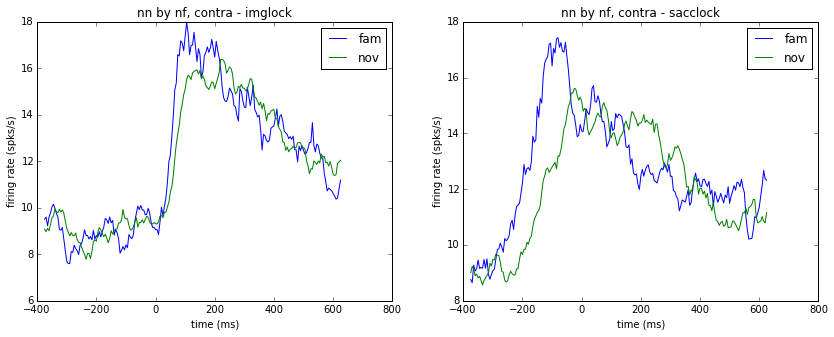

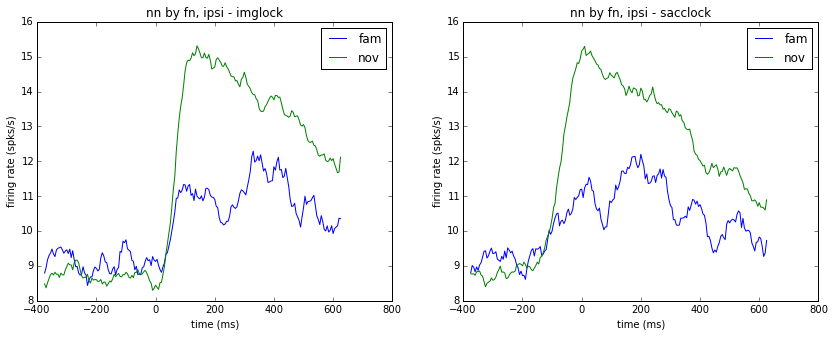

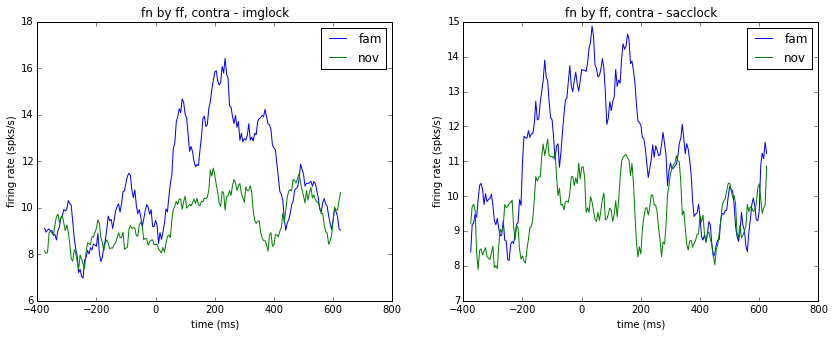

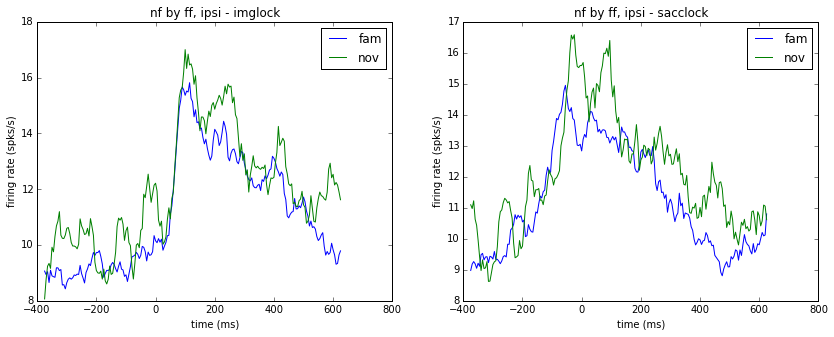

In [103]:
reload(vplt)

# saccade to nov on contra side
# nov is nn 
# fam is nf
vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by nf, contra',
                     ipsicontra='contra', base='off_nov')

vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nn by fn, ipsi',
                     ipsicontra='ipsi', base='off_nov')

vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='fn by ff, contra',
                     ipsicontra='contra', base='off_fam')

vplt.comb_ci_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, title='nf by ff, ipsi',
                     ipsicontra='ipsi', base='off_fam')

#### Single unit ####

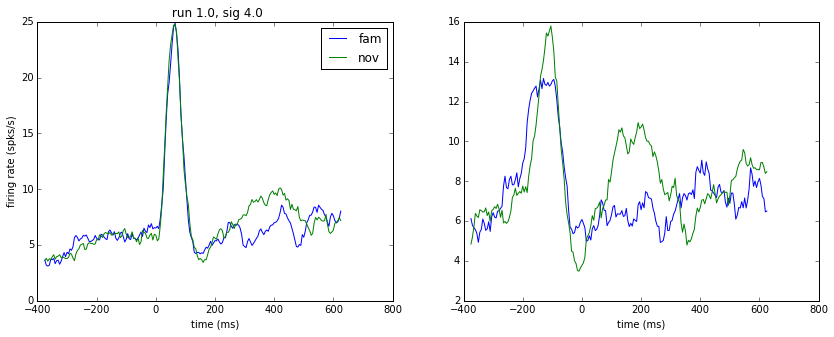

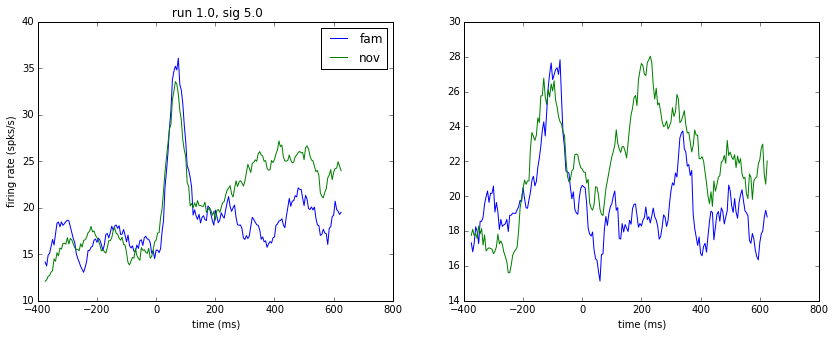

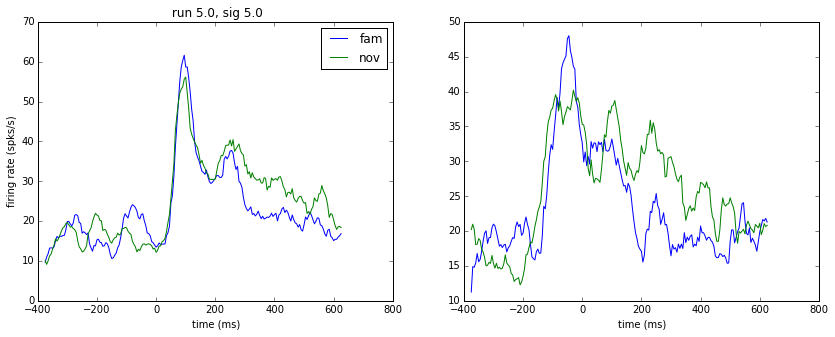

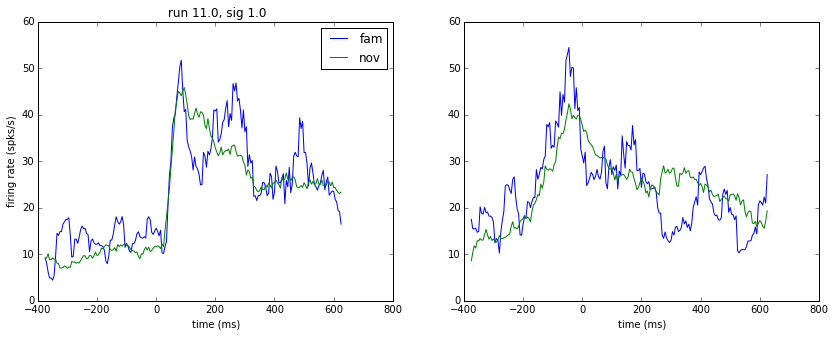

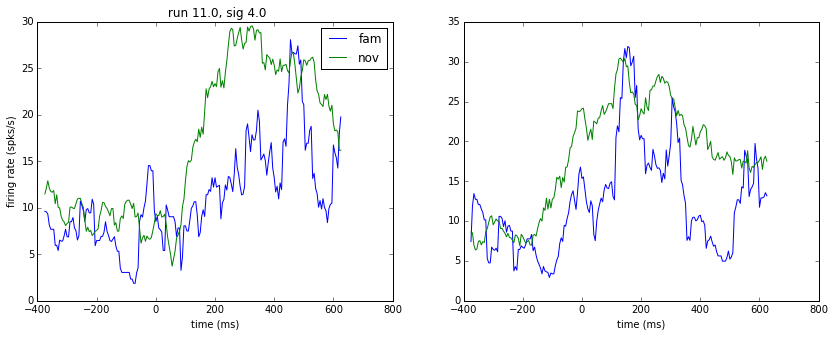

In [109]:
reload(vplt)
inds = [3, 4, 21, 43, 46]
vplt.show_nov_fam_singles(sinu_imgold, xs_io, inds=inds, comp=sinu_saccold, rec=nr_io)
# vplt.show_nov_fam_singles(sinu_saccold, xs_so, inds=inds)

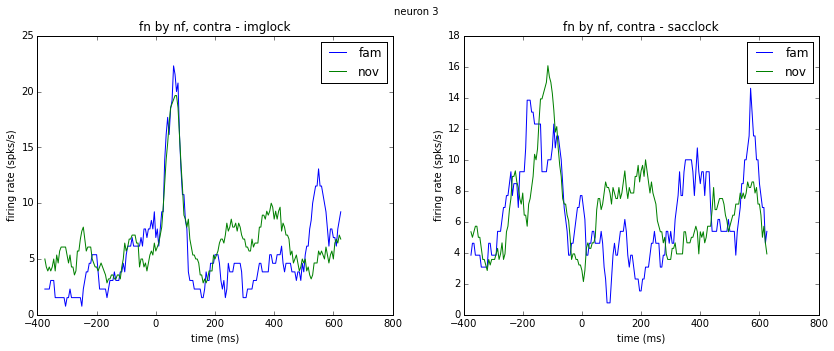

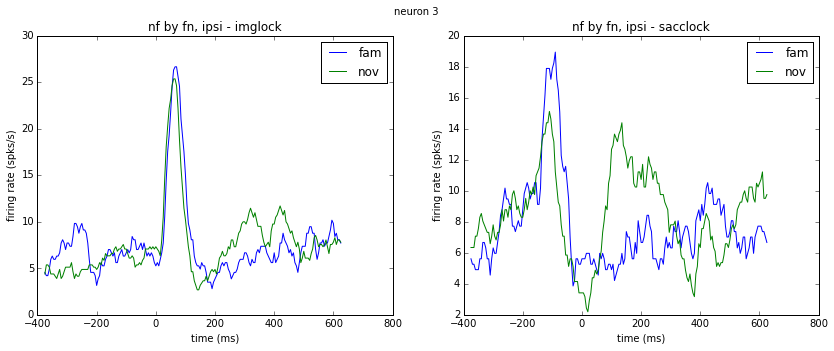

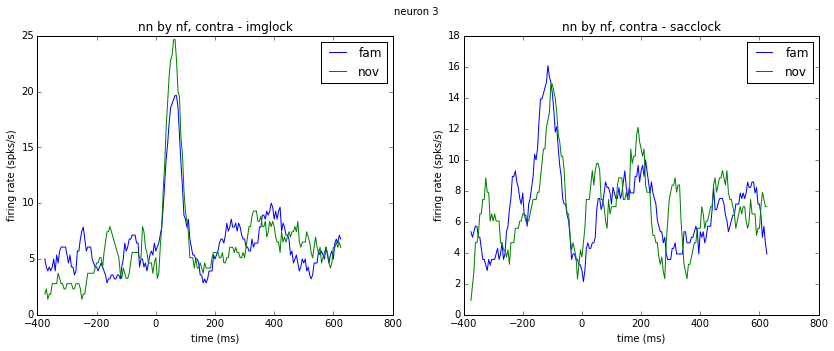

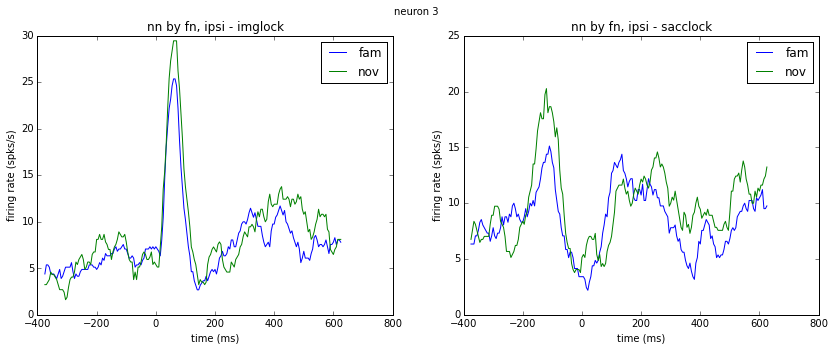

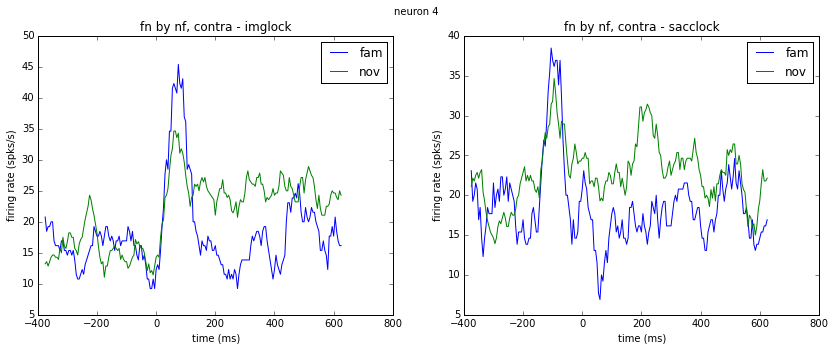

...

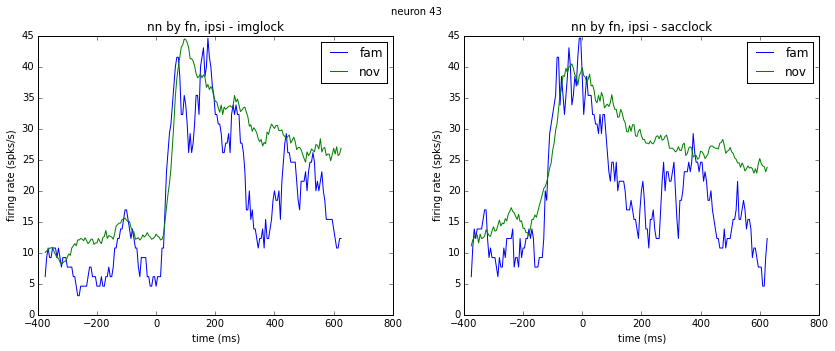

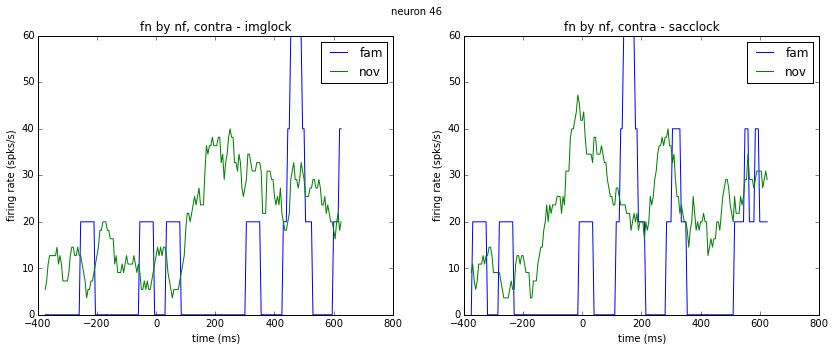

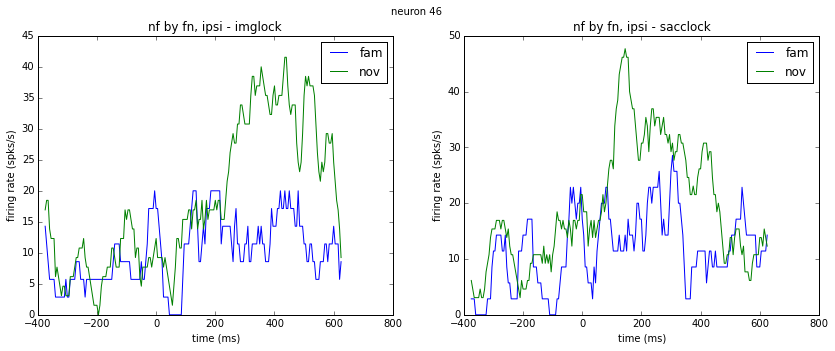

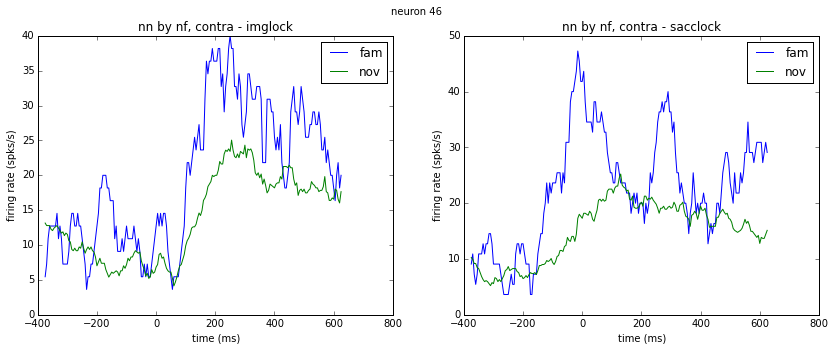

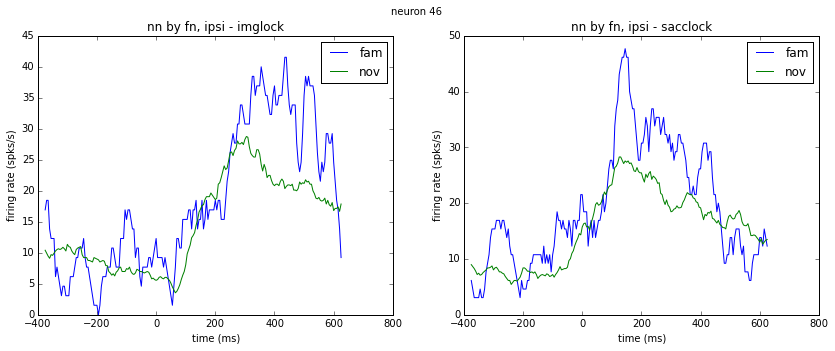

In [128]:
reload(vplt)
su_conds = [None, 'off_nov', 'off_fam', 'fam', 'nov', 'all', 'same']
contratitle = ['fn by nf', 'nn by nf', 'fn by ff', 'nf by ff', 'nn by fn', 
               'nn + nf by ff + fn', 'nn by ff']
ipsititle = ['nf by fn', 'nn by fn', '', 'fn by ff', 'nn by nf', 
             'fn + nn by ff + nf', 'nn by ff']
for i in inds:
    for j, cond in enumerate(su_conds):
        vplt.comb_ci_sus_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, 
                                 titlecontra=contratitle[j], titleipsi=ipsititle[j], 
                                 inds=[i], base=cond)

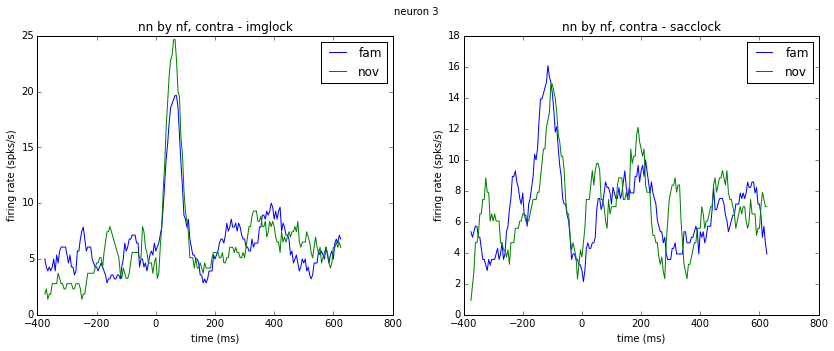

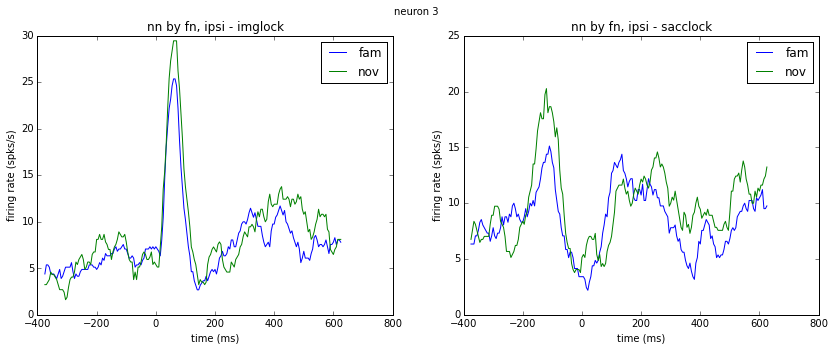

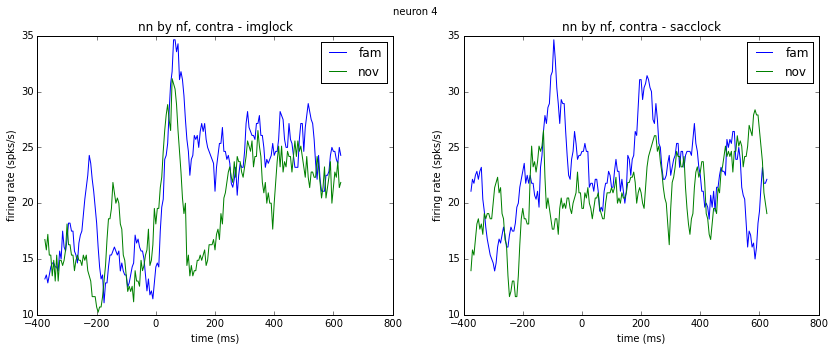

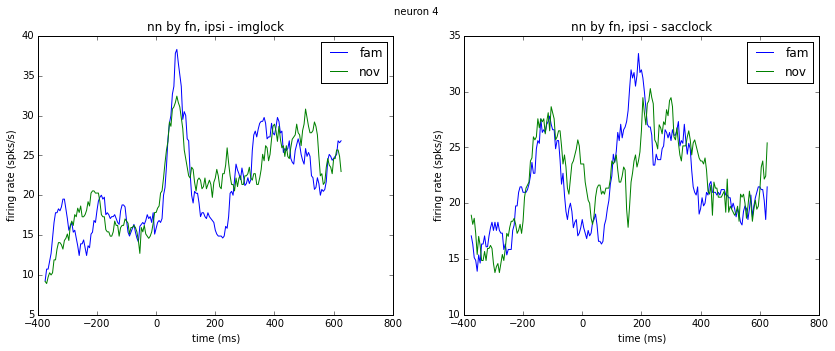

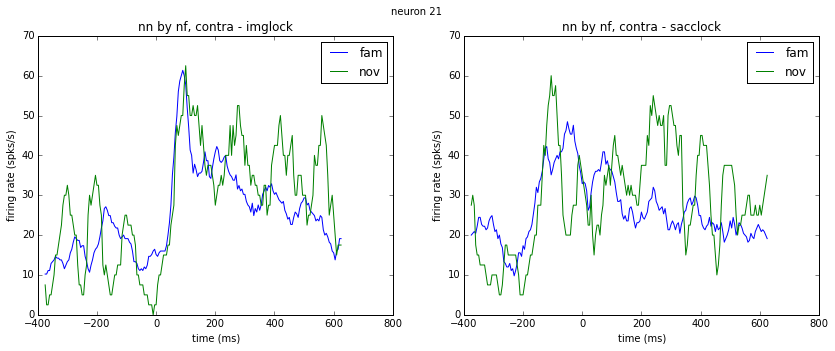

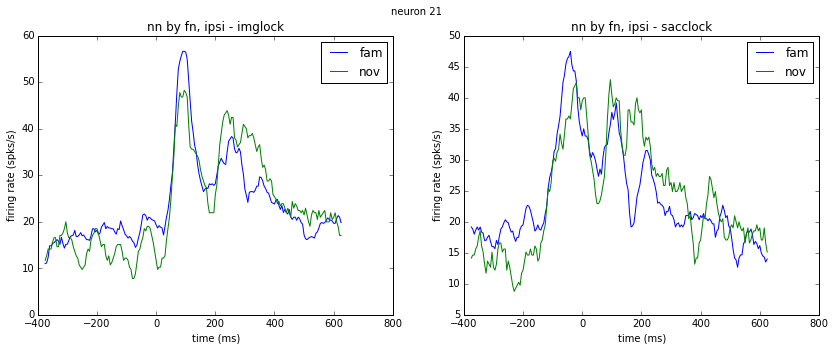

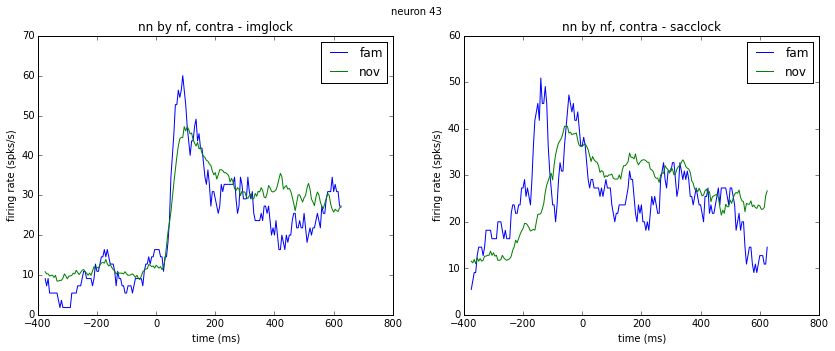

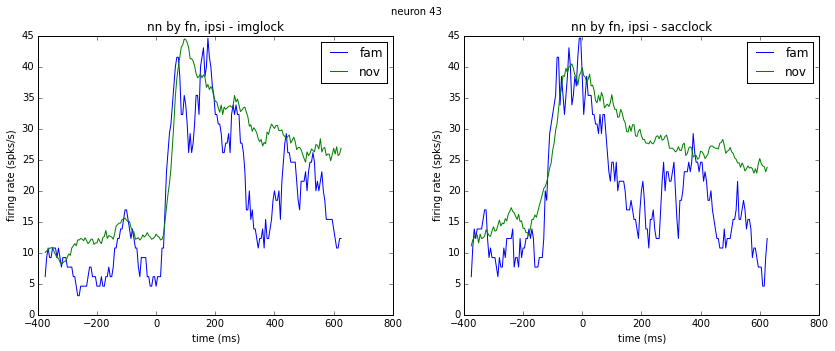

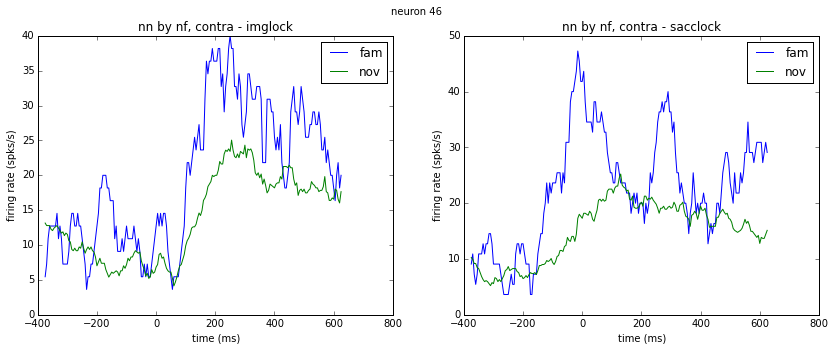

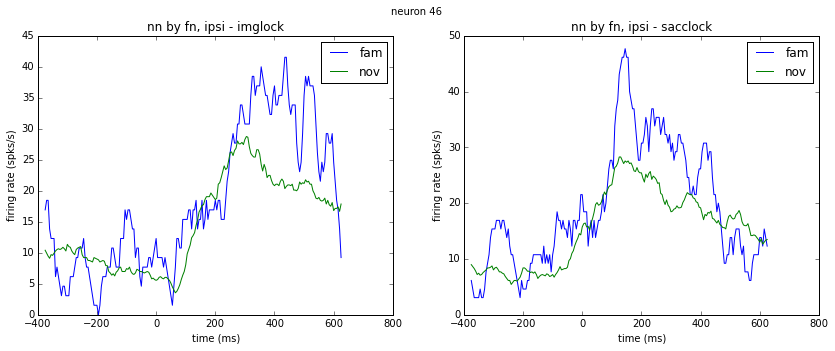

In [123]:
reload(vplt)
vplt.comb_ci_sus_saccimg(sinu_imgold, xs_io, sinu_saccold, xs_so, titlecontra='nn by nf',
                         titleipsi='nn by fn', inds=inds, base='off_nov')

### Dimming ###

In [66]:
reload(dim)
famimgs = os.listdir('../famimgs/')[1:]
mean_us, std_us, xs = dim.get_img_response(old_ed, famimgs, step=5, winsize=50, pretime=-300)

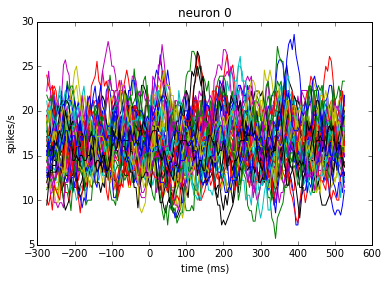

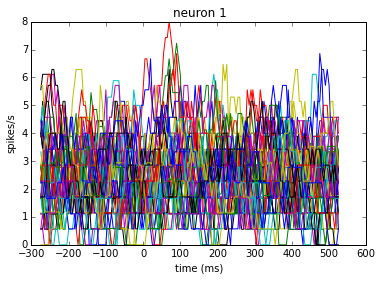

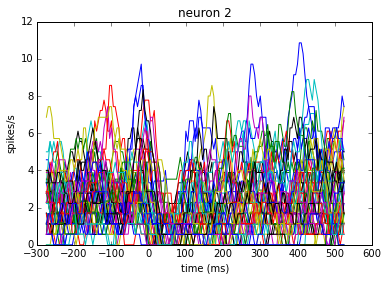

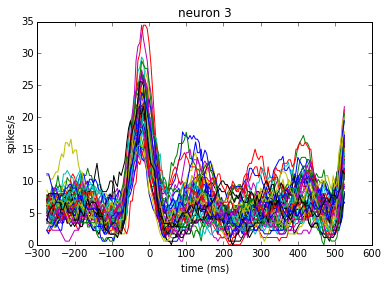

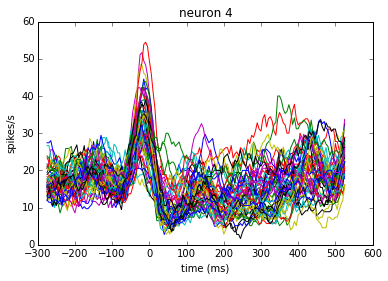

...

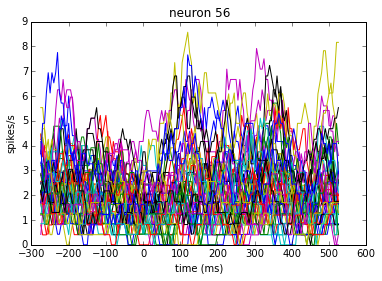

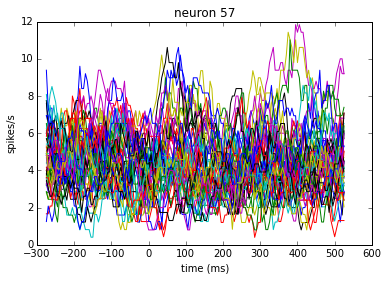

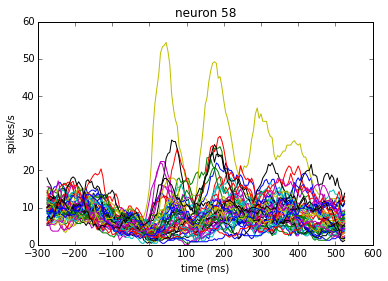

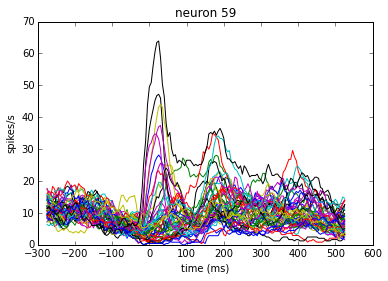

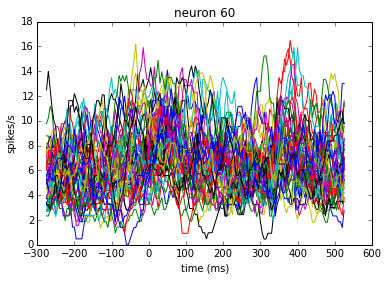

In [70]:
reload(dim)
dim.show_single_unit_allimg(mean_us, xs, mean_us.keys())